# <center>Discovering the perfect lodging for my family in Bangkok: My journey of analytical exploration and finding the best fit.</center>

## Introduction 
Airbnb provides a wide range of datasets that contain information about their listings, hosts, guests, and bookings. These datasets are valuable resources for researchers, data analysts, and data scientists interested in studying various aspects of the sharing economy, tourism, and hospitality industries.

Some of the Airbnb datasets that are commonly used include:

Listings dataset: This dataset provides detailed information about Airbnb listings, including their location, property type, number of bedrooms and bathrooms, amenities, and reviews.

Calendar dataset: This dataset contains information about the availability of Airbnb listings over time, including their price and minimum stay requirements.

Reviews dataset: This dataset includes reviews and ratings provided by guests who have stayed at Airbnb listings, which can be used to analyze the quality of the listings and the guests' experiences.

## Tasks:
1) Strategies for searching for my family's best accommodation in Bangkok: Factors to consider and price analysis.

2) Investigating the average price trend for Airbnb properties in Bangkok over 2023 according to the dataset - calendar to ascertain some patterns. Compare this trend with the selected housing location for the family.

3) Investigating the trend of the number of reviews for Airbnb properties in Bangkok over time to ascertain any recognizable patterns or changes.

In addition, we should:
1) Evaluate the quantity of accommodation offered in Bangkok categorized by their respective districts.

2) Examine the mean prices of hotels based on evaluations provided by tourists.

3) Investigate a potential relationship between various characteristics.

## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

px.defaults.width = 1000
px.defaults.height = 700

my_token = 'pk.eyJ1Ijoia2luNzc3IiwiYSI6ImNsZ3p4a3l3NDBvMW8zbHBlc3lzNGM0dDkifQ.j_dzNOLIrkZmgOboMrBfRw'

### Loading the datasets

In [2]:
df_property  = pd.read_csv('data//listings.csv')
df_property.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17396 entries, 0 to 17395
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            17396 non-null  int64  
 1   listing_url                                   17396 non-null  object 
 2   scrape_id                                     17396 non-null  int64  
 3   last_scraped                                  17396 non-null  object 
 4   source                                        17396 non-null  object 
 5   name                                          17388 non-null  object 
 6   description                                   16826 non-null  object 
 7   neighborhood_overview                         8831 non-null   object 
 8   picture_url                                   17396 non-null  object 
 9   host_id                                       17396 non-null 

In [3]:
df_calendar = pd.read_csv('data//calendar.csv')
df_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6349543 entries, 0 to 6349542
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  object 
 5   minimum_nights  float64
 6   maximum_nights  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 339.1+ MB


In [4]:
df_reviews = pd.read_csv('data//reviews.csv')
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290946 entries, 0 to 290945
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     290946 non-null  int64 
 1   id             290946 non-null  int64 
 2   date           290946 non-null  object
 3   reviewer_id    290946 non-null  int64 
 4   reviewer_name  290945 non-null  object
 5   comments       290919 non-null  object
dtypes: int64(3), object(3)
memory usage: 13.3+ MB


## Exploratory Data Analysis 

In [5]:
df_property[['name', 'price', 'calculated_host_listings_count']].head(5)

,name,price,calculated_host_listings_count
0,Ama Hostel Bangkok - Private Room For 8 Person,"$4,800.00",8
1,Ama Hostel Bangkok - Quadruple Room Shared Bath,"$2,800.00",8
2,A Bit of Heaven in Bangkok,"$2,570.00",1
3,Warm two-bedroom,"$2,570.00",1
4,Supalai Wellington 2,$890.00,1


In [6]:
df_calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,27934,2023-03-29,f,"$1,885.00","$1,885.00",3.0,90.0
1,27934,2023-03-30,f,"$1,885.00","$1,885.00",3.0,90.0
2,27934,2023-03-31,f,"$1,885.00","$1,885.00",3.0,90.0
3,27934,2023-04-01,t,"$1,885.00","$1,885.00",3.0,90.0
4,27934,2023-04-02,t,"$1,885.00","$1,885.00",3.0,90.0


In [7]:
df_property[df_property['id']== 30216638]['price']

0    $4,800.00
Name: price, dtype: object

#### The first problem is that the price has to be in Thai baht, but here are dollars as a object. It is not correct. We have to transfer all prices to the format Thai baht as type float. 


In [8]:
# The purpose of this function is to convert a string representation of a price (e.g. "$1,234.56") into a floating-point number (e.g. 1234.56).
def obj_to_float(str_price): 
    s=str(str_price)
    return float(''.join([s[i] for i in range(len(s)) if (s[i] != '$') & (s[i] != ',')]))


In [9]:
df_property['price_thb'] = df_property['price'].apply(obj_to_float) 


In [10]:
df_calendar['price_thb']=df_calendar['price'].apply(obj_to_float) 

### 1) Strategies for searching the best accommodation in Bangkok for my family: Factors to consider and price analysis.

To ensure a comfortable and enjoyable family stay in Bangkok, it's crucial to analyze prices and consider factors like reviews, location, etc. By researching and evaluating options, you can find the most suitable lodging option that fits your budget and meets your needs.

### Let's see the count of accommodation for every neighborhoods 

In [11]:
df_property['neighbourhood_cleansed'].value_counts().head(10)

Vadhana         2515
Khlong Toei     2320
Huai Khwang     1328
Ratchathewi     1225
Sathon           881
Bang Rak         844
Phra Nakhon      651
Phra Khanong     618
Chatu Chak       602
Parthum Wan      502
Name: neighbourhood_cleansed, dtype: int64

In [12]:
print('Min count of the property in the Neighbourhood =  ' +str(df_property['neighbourhood_cleansed'].value_counts().min()))

Min count of the property in the Neighbourhood =  6


In [13]:
print('Max count of the property in the Neighbourhood =  ' +str(df_property['neighbourhood_cleansed'].value_counts().max()))

Max count of the property in the Neighbourhood =  2515


<AxesSubplot:>

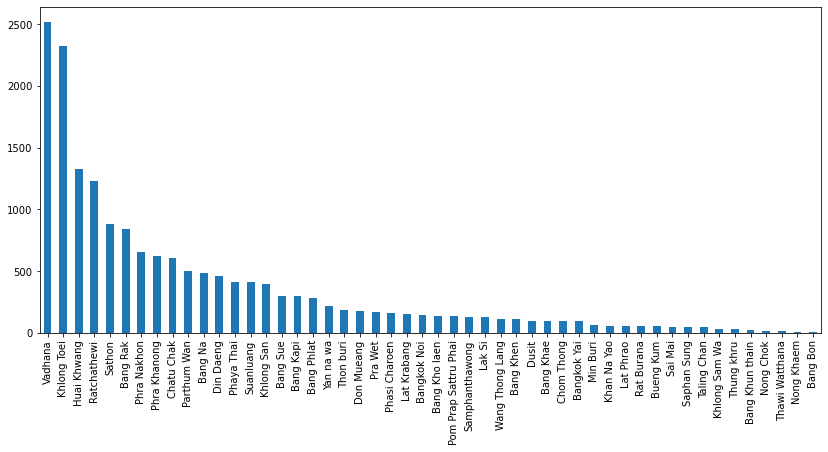

In [14]:
plt.figure(figsize=(14,6))
df_property['neighbourhood_cleansed'].value_counts().plot.bar()


#### Result 
Result Evaluation is the minimum offers of accommodations in Bang Bon(a district in the southwestern part of Bangkok) =6. The maximum are in Vadhana=2490. Vadhana is known for its vibrant nightlife, shopping centers, and entertainment venues, as well as its cultural and historical landmarks, such as the Benjasiri Park and the Wat Mai Chong Lom temple. 

In [ ]:
# ------------------------------------------------------------------------------------------------------------------

In [15]:
df_property[df_property['price_thb']==df_property['price_thb'].max()]



,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_thb
3747,760754030005377094,https://www.airbnb.com/rooms/760754030005377094,20230328184442,2023-03-29,previous scrape,Subway MRT Huaikhwang /Charming Place/1 Bedroom,"My accommodation is located at Huaikhwang, wi...",Every morning you can have a Starbuck coffee n...,https://a0.muscache.com/pictures/miso/Hosting-...,487641615,...,4.44,5.00,NaN,f,1,1,0,0,2.20,1000000.0
8385,11579635,https://www.airbnb.com/rooms/11579635,20230328184442,2023-03-29,city scrape,"2 Bedroom,wifi,5mMRT&Shopping Mall",You will feel comfortable and at home while st...,Phra ram 9 is a lively area conveniently locat...,https://a0.muscache.com/pictures/770ac184-8d94...,30803267,...,4.60,4.53,NaN,f,4,4,0,0,0.62,1000000.0
9824,8880974,https://www.airbnb.com/rooms/8880974,20230328184442,2023-03-29,city scrape,"Modern,wifi,5m MRT&2 Shopping Mall",Aspire Condo 37sqm 1 bedroom condominium. just...,Phra Ram 9 is a lively area conveniently locat...,https://a0.muscache.com/pictures/c71639a0-d9d4...,30803267,...,4.87,4.80,NaN,f,4,4,0,0,0.50,1000000.0
15815,23740993,https://www.airbnb.com/rooms/23740993,20230328184442,2023-03-29,city scrape,"Modern&Luxury apartment,5min to MRT,freeWifi",Our large and comfortable 2 bedroom apartment(...,NaN,https://a0.muscache.com/pictures/06e326da-c032...,30803267,...,4.75,4.67,NaN,f,4,4,0,0,0.21,1000000.0


In [13]:
# Here are too high prices. It is an outlier in data  
# https://www.airbnb.com/rooms/760754030005377094
# https://www.airbnb.com/rooms/8880974
# https://www.airbnb.com/rooms/11579635
# https://www.airbnb.com/rooms/23740993

In [16]:
df_property[df_property['price_thb']==df_property['price_thb'].min()]

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_thb
9896,846665444780395093,https://www.airbnb.com/rooms/846665444780395093,20230328184442,2023-03-29,city scrape,1 Step from BTS Onnut! 40sqm High-class condo : ),☀Just 1 step from BTS Onnut station<br />-Larg...,BTS Onnut Station,https://a0.muscache.com/pictures/miso/Hosting-...,4079585,...,5.0,5.0,NaN,f,1,1,0,0,3.0,120.0


In [ ]:
# This is the minimum price, and it appears to be reasonable.

### Let's build the bar chart of average prices for each neighborhood. 

In [17]:
average_price= df_property.groupby('neighbourhood_cleansed').mean()['price_thb']

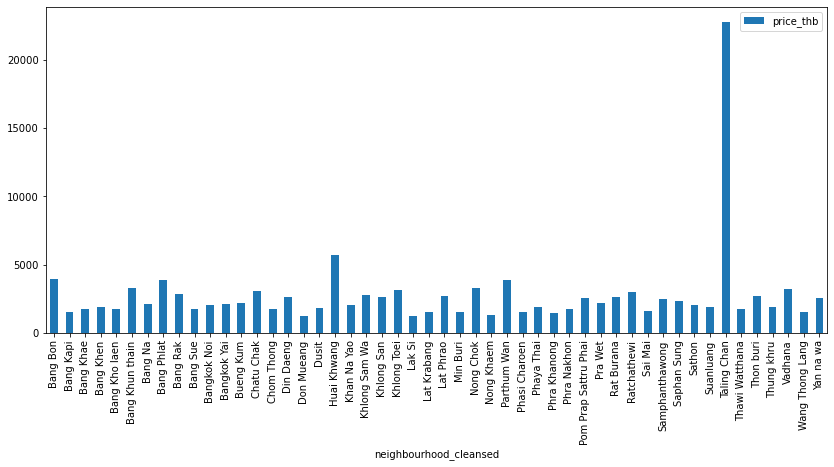

In [18]:
plt.figure(figsize=(14,6))
average_price.plot.bar()
plt.legend()

In [17]:
# We need to remove any extreme values. The price may not exceed 20,000 THB per night.

In [19]:
df_property = df_property[df_property['price_thb']<20000]

In [20]:
df_property[df_property['price_thb']==df_property['price_thb'].max()][['neighbourhood_cleansed', 'name', 'price_thb']]

,neighbourhood_cleansed,name,price_thb
13321,Vadhana,Amazing House with Roof-Top Pool in Thonglor,19986.0


In [21]:
average_price= df_property.groupby('neighbourhood_cleansed').mean()['price_thb']

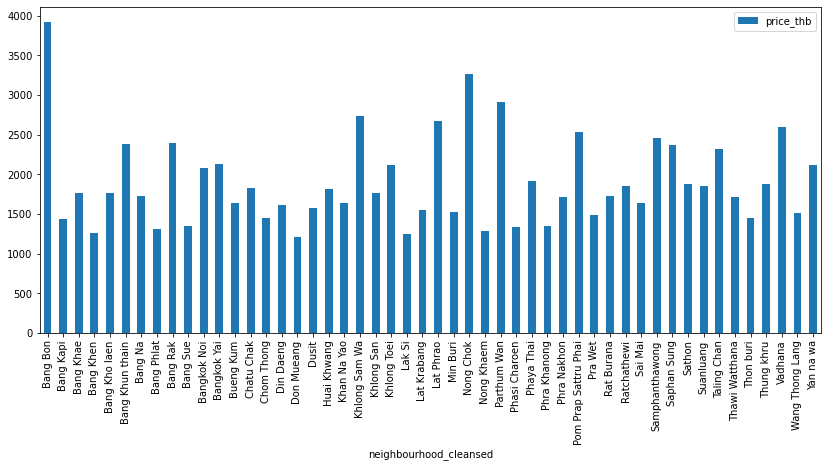

In [22]:
plt.figure(figsize=(14,6))
average_price.plot.bar()
plt.legend()

#### Result 
The bar chart displays appealing information. The difference in average prices across various neighborhoods is not extremely significant. However, Bang Bon and Nong Chok districts are the most costly.

In [22]:
#-------------------------------------------------------------------------------------------------------------------

### We will examine the mean prices of hotels based on evaluations provided by tourists.

In [23]:
df_property['review_rounded'] = df_property['review_scores_value'].round()

In [24]:
tmp_df = df_property.groupby('review_rounded')['price_thb'].mean().round().reset_index(name='average_prices')


In [25]:
tmp_df.describe()


,review_rounded,average_prices
count,6.000000,6.000000
mean,2.500000,2269.833333
std,1.870829,1249.506209
min,0.000000,1530.000000
25%,1.250000,1690.000000
50%,2.500000,1812.000000
75%,3.750000,1966.250000
max,5.000000,4798.000000


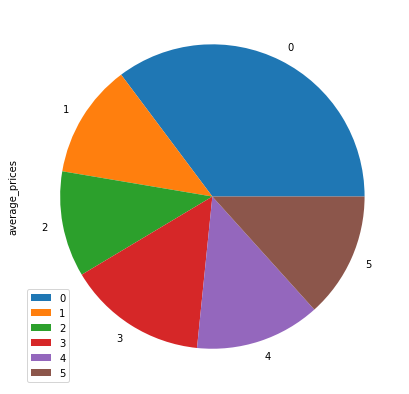

In [26]:
plt.figure(figsize=(7,7))
tmp_df['average_prices'].plot.pie()
plt.legend()

#### Result 
After conducting a thorough analysis of the data, we have concluded that there is little discernible difference in hotel prices based on tourist evaluations. However, it should be noted that properties with no reviews or those with a score close to zero tend to have higher prices. Here it will be essential to make additional investigations in the future. 


In [ ]:
#------------------------------------------------------------------------------------------------------------

In [27]:
df_property.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [28]:
df_property[df_property.name.isnull() == True]

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_thb,review_rounded
74,4720818,https://www.airbnb.com/rooms/4720818,20230328184442,2023-03-29,city scrape,NaN,Room for rent near MRT Huay Kwang station.<br ...,NaN,https://a0.muscache.com/pictures/59268815/48c0...,24386225,...,NaN,NaN,f,1,0,1,0,NaN,1200.0,NaN
1170,4245018,https://www.airbnb.com/rooms/4245018,20230328184442,2023-03-28,city scrape,NaN,<b>The space</b><br />The old shop house was b...,NaN,https://a0.muscache.com/pictures/53314583/1591...,22030043,...,NaN,NaN,f,1,0,1,0,NaN,1200.0,NaN
3926,4549768,https://www.airbnb.com/rooms/4549768,20230328184442,2023-03-29,city scrape,NaN,NaN,NaN,https://a0.muscache.com/pictures/57555128/251b...,18852579,...,NaN,NaN,f,1,0,1,0,NaN,1080.0,NaN
4166,10710165,https://www.airbnb.com/rooms/10710165,20230328184442,2023-03-29,city scrape,NaN,"-Fully furnished with modern closet, dressing ...",NaN,https://a0.muscache.com/pictures/fee3ff6b-a268...,55347997,...,NaN,NaN,t,1,0,1,0,NaN,1000.0,NaN
6422,6148415,https://www.airbnb.com/rooms/6148415,20230328184442,2023-03-29,city scrape,NaN,<b>The space</b><br />Feature / description<br...,Location<br />Absolute convenience / Transport...,https://a0.muscache.com/pictures/76635501/2816...,31895202,...,NaN,NaN,f,1,1,0,0,NaN,2399.0,NaN
8942,10000742,https://www.airbnb.com/rooms/10000742,20230328184442,2023-03-29,city scrape,NaN,Diamond Bangkok<br />Near BTS Ratchathewi Stat...,Diamond Bangkok<br />Near BTS Ratchathewi Stat...,https://a0.muscache.com/pictures/e69fd5f9-b619...,51374914,...,3.83,NaN,t,1,0,1,0,0.07,930.0,4.0
11005,8055144,https://www.airbnb.com/rooms/8055144,20230328184442,2023-03-29,city scrape,NaN,"Luxury Condominium in CBD area of Bangkok, Suk...",NaN,https://a0.muscache.com/pictures/102664030/c25...,42521288,...,NaN,NaN,t,1,0,1,0,NaN,5000.0,NaN
16898,13142743,https://www.airbnb.com/rooms/13142743,20230328184442,2023-03-29,city scrape,NaN,"Errday Guest House for rent daily, monthly, co...",NaN,https://a0.muscache.com/pictures/1887b079-baae...,73275200,...,4.50,NaN,f,3,0,3,0,0.03,850.0,4.0


### We should eliminate any rows with a null value in the "name" column.

In [29]:
df_property = df_property[df_property.name.isnull() == False]

In [30]:
df_property[['name', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17256 entries, 0 to 17395
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   name                         17256 non-null  object 
 1   number_of_reviews            17256 non-null  int64  
 2   number_of_reviews_ltm        17256 non-null  int64  
 3   number_of_reviews_l30d       17256 non-null  int64  
 4   first_review                 11150 non-null  object 
 5   last_review                  11150 non-null  object 
 6   review_scores_rating         11150 non-null  float64
 7   review_scores_accuracy       11026 non-null  float64
 8   review_scores_cleanliness    11025 non-null  float64
 9   review_scores_checkin        11020 non-null  float64
 10  review_scores_communication  11025 non-null  float64
 11  review_scores_location       11019 non-null  float64
 12  review_scores_value          11018 non-null  float64
dtypes: float64(7), i

### We need to search for the optimal real estate based on its price and reviews from my family.

##### To get the best option:
The filter condition is based on multiple criteria:
review_scores_value column is not null and equals 5,
bedrooms column has a value greater than 2,
number_of_reviews column has a value greater than 10.

In [31]:
df_property[(df_property['review_scores_value'].isnull() == False)&(df_property['bedrooms']>2)&(df_property['review_scores_value'] == 5)&(df_property['number_of_reviews']>10)][['name','neighbourhood_cleansed','price_thb','property_type', 'accommodates','review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location', 'review_scores_value']]

,name,neighbourhood_cleansed,price_thb,property_type,accommodates,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
2191,100 Residence near Thonglor/Ekamai,Huai Khwang,9350.0,Entire home,8,5.0,5.00,5.00,5.00,5.0,4.67,5.0
3114,4/BR Private House Silom CBD Bangkok BTS Surasak,Bang Rak,9440.0,Entire townhouse,11,5.0,5.00,5.00,5.00,5.0,5.00,5.0
7186,My home@DMK +Free wifi +10 minutes+ near airport,Don Mueang,2354.0,Entire townhouse,6,5.0,5.00,5.00,5.00,5.0,4.94,5.0
8887,Opal House 3BR@BTS Mo Chit station(N8)(BL13) 日...,Chatu Chak,2642.0,Entire home,7,5.0,5.00,5.00,4.92,5.0,4.77,5.0
11940,COZY_5Bed_CITY CENTER_Nana BTS_Siam_Central World,Khlong Toei,4985.0,Entire townhouse,13,5.0,4.86,4.95,5.00,5.0,4.70,5.0


In [ ]:
#The three real estates have the best according to the price and review. 
# id = 7186 name = My home@DMK +Free wifi +10 minutes+ near airport
# id = 8887 name = Opal House 3BR@BTS Mo Chit station(N8)(BL13) 日...
# id = 11940 name = COZY_5Bed_CITY CENTER_Nana BTS_Siam_Central World


### Let's create a scatter Mapbox to visualize and choose the best district. 

In [32]:
my_home = df_property[df_property['id'] == 548975819281651554][['latitude', 'longitude']].values.flatten().tolist()
print(list(my_home))

[13.73534, 100.553993]


In [33]:
px.set_mapbox_access_token(my_token)

fig = px.scatter_mapbox(df_property, 
                        lat='latitude', 
                        lon='longitude',
                        color='neighbourhood_cleansed', 
                        size='price_thb', 
                        color_continuous_scale=px.colors.cyclical.IceFire, 
                        hover_name='name',
                        hover_data=['listing_url', 'property_type'],
                        size_max=15, 
                        zoom=10,
                        title='A price group map of neighborhoods with a red circle indicates my accommodation!')

fig.add_trace(go.Scattermapbox(
        lat = [13.73534],
        lon = [100.553993],
        mode = 'markers',
        marker=go.scattermapbox.Marker(
            size=20,
            color='rgb(255, 0, 0)',
            opacity=0.7
        ),
        text='The best accomadation for my family!!!',
        hoverinfo='text'
    ))


fig.update_layout(mapbox_style = 'open-street-map' )
fig.show()

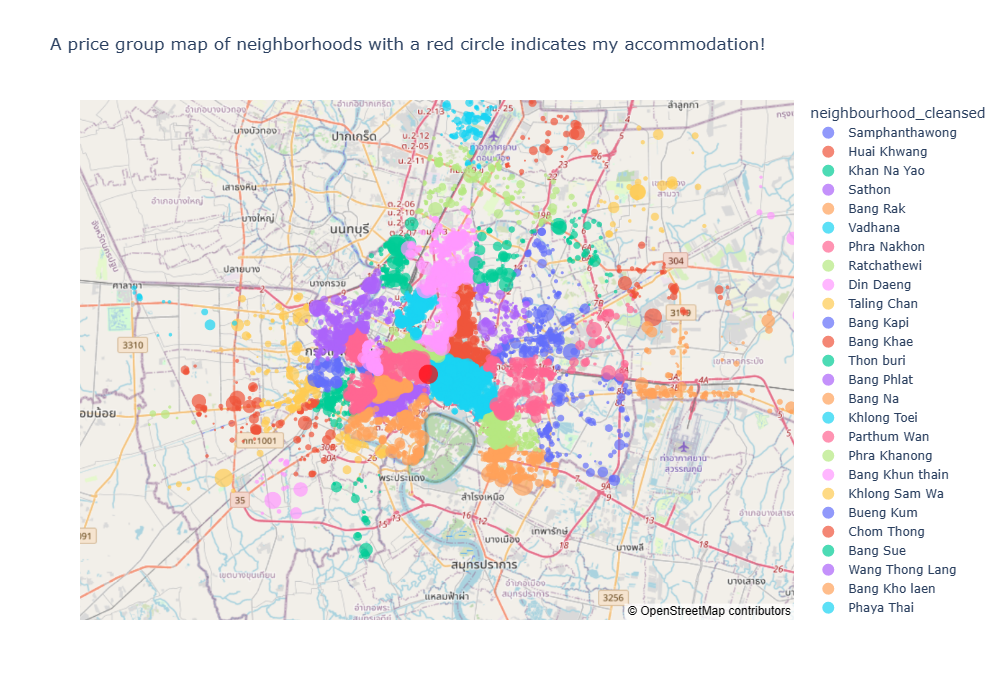

In [34]:
from IPython.display import Image
Image(filename='art3.png')

### The best accomadation for my family: 

In [35]:
df_property[df_property['id'] == 548975819281651554]

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_thb,review_rounded
11940,548975819281651554,https://www.airbnb.com/rooms/548975819281651554,20230328184442,2023-03-29,city scrape,COZY_5Bed_CITY CENTER_Nana BTS_Siam_Central World,🌟My townhouse is in the CENTER of Bangkok and ...,The townhouse locates in a residential area wh...,https://a0.muscache.com/pictures/miso/Hosting-...,221674027,...,5.0,NaN,f,2,2,0,0,2.66,4985.0,5.0


### Result Evaluation task №1. 
In conclusion, based on our analysis of the data, we have found that evaluating factors such as price, reviews, location, and amenities is crucial in finding the most suitable lodging option for your needs and budget. By conducting thorough research and evaluating your options, you can make an informed decision and ensure a comfortable and enjoyable stay in "COZY_5Bed_CITY CENTER_Nana BTS_Siam_Central World" in the neighborhood -  Khlong Toei. It is an amazing townhouse in the center of Bangkok. 	

### Next step, we should search for a correlation between different features.

In [36]:
df_corr = df_property[['price_thb', 
       'neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 
       'bedrooms', 'beds', 'amenities', 
       'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 
       'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms'
       ]]

In [37]:
df_corr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17256 entries, 0 to 17395
Data columns (total 26 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   price_thb                                     17256 non-null  float64
 1   neighbourhood_cleansed                        17256 non-null  object 
 2   latitude                                      17256 non-null  float64
 3   longitude                                     17256 non-null  float64
 4   property_type                                 17256 non-null  object 
 5   room_type                                     17256 non-null  object 
 6   accommodates                                  17256 non-null  int64  
 7   bedrooms                                      15907 non-null  float64
 8   beds                                          16926 non-null  float64
 9   amenities                                     17256 non-null 

In [38]:
corr = df_corr.corr(method='kendall')  

In [39]:
corr.columns

Index(['price_thb', 'latitude', 'longitude', 'accommodates', 'bedrooms',
       'beds', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
       'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms'],
      dtype='object')

<AxesSubplot:>

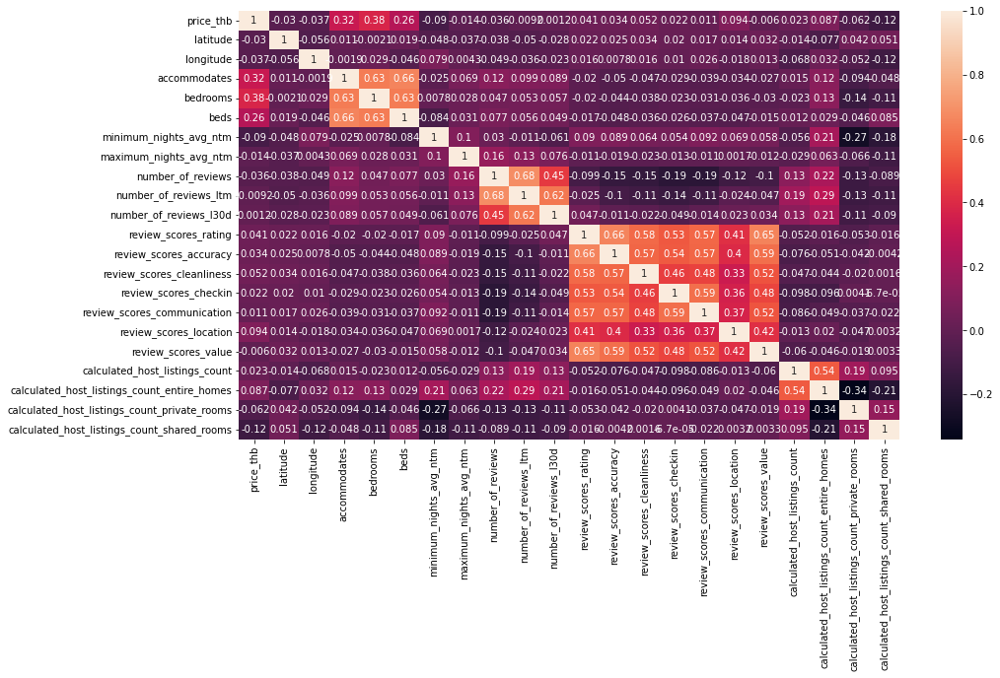

In [40]:

plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)



#### The correlation between different variables in a dataset.
The heatmap plot shows the correlation between different variables in a dataset. This type of plot helps identify patterns and relationships in the data, which can help make informed decisions or develop models in the future.
In our particular case, the correlation between variables in the dataset is relatively weak.

In [ ]:
#---------------------------------------------------------------------------------------------------------------------

###  2) Investigating the trend of the average price for Airbnb properties in Bangkok over 2023 according to the dataset - calendar to ascertain some patterns.  Compare this trend with the selected housing location for the family.

In [41]:
df_calendar.date= pd.to_datetime(df_calendar.date)
df_calendar['year'] = df_calendar.date.dt.year
df_calendar['month'] = df_calendar.date.dt.month
df_calendar.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6349543 entries, 0 to 6349542
Data columns (total 10 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      int64         
 1   date            datetime64[ns]
 2   available       object        
 3   price           object        
 4   adjusted_price  object        
 5   minimum_nights  float64       
 6   maximum_nights  float64       
 7   price_thb       float64       
 8   year            int64         
 9   month           int64         
dtypes: datetime64[ns](1), float64(3), int64(3), object(3)
memory usage: 484.4+ MB


In [42]:
mean_prices = df_calendar.groupby(['year','month'])['price_thb'].mean().reset_index()
# We take data from 2023. 
mean_prices = mean_prices.loc[(mean_prices.year<=2023) & (mean_prices.year>2022),:]
mean_prices.head(12)

,year,month,price_thb
0,2023,3,2906.067303
1,2023,4,2958.706099
2,2023,5,2770.132207
3,2023,6,2741.074778
4,2023,7,2745.640344
5,2023,8,2759.698145
6,2023,9,2755.928267
7,2023,10,2757.183801
8,2023,11,2763.937557
9,2023,12,2794.280563


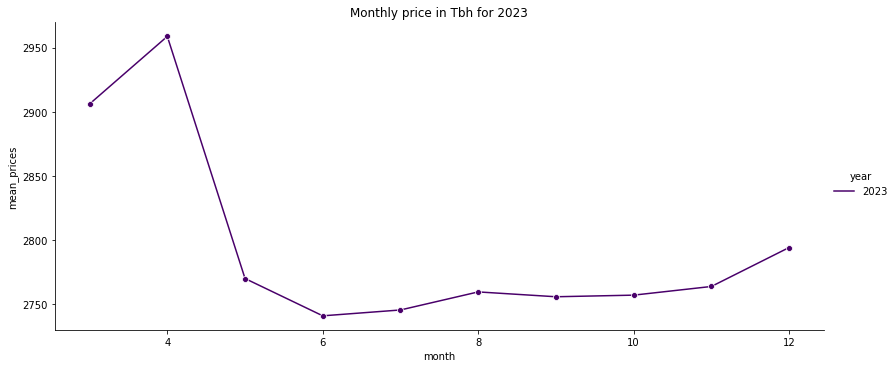

In [43]:
sns.relplot(data=mean_prices,x='month',hue='year',y='price_thb',marker='o',kind='line',palette='RdPu_r', aspect=14/6)
ax = plt.gca()
ax.set_ylabel("mean_prices")
ax.set_title("Monthly price in Tbh for 2023")
plt.show()

In [44]:
df_best = df_calendar[df_calendar['listing_id']==548975819281651554]

mean_prices = df_best.groupby(['year','month'])['price_thb'].mean().reset_index()
# We take data from 2023 for the best accomadation for my family. 
mean_prices = mean_prices.loc[(mean_prices.year<=2023) & (mean_prices.year>2014),:]
mean_prices.head(100)


,year,month,price_thb
0,2023,3,4999.666667
1,2023,4,5366.466667
2,2023,5,5219.354839
3,2023,6,5600.000000
4,2023,7,5600.000000
5,2023,8,5600.000000
6,2023,9,5600.000000
7,2023,10,5600.000000
8,2023,11,5600.000000
9,2023,12,5600.000000


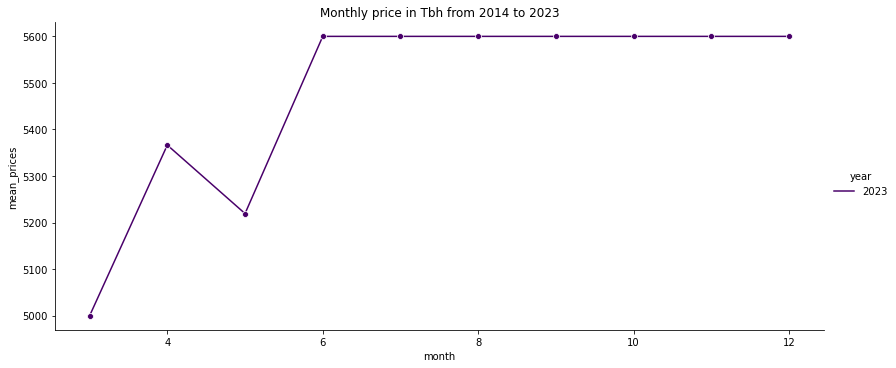

In [45]:
sns.relplot(data=mean_prices,x='month',hue='year',y='price_thb',marker='o',kind='line',palette='RdPu_r', aspect=14/6)
ax = plt.gca()
ax.set_ylabel("mean_prices")
ax.set_title("Monthly price in Tbh from 2014 to 2023")
plt.show()

### Result Evaluation task №2. 
The prices of accommodations are relatively elevated during the initial months of the year, with the peak mean price observed in April. After that, however, prices exhibit a steep decline until October, after which they experience a mild increase. Based on this observation, I recommend adjusting the price point to align with the beginning of the season, which falls around November. This would be a suitable approach to take, given the overall trend in prices that has been observed.
It is worth noting that the selected accommodation for my family has seen a rise in price since June, which deviates from the primary trend observed in the broader accommodation market. This could be a relevant observation to consider when analyzing the pricing strategy for this particular property, as there may be unique factors at play that influence its price dynamics differently from the overall market trend.

In [ ]:
#---------------------------------------------------------------------

###  3) Investigating the trend of the number of reviews for Airbnb properties in Bangkok over time to ascertain any recognizable patterns or changes.

The aim is to investigate the trend of the number of reviews for Airbnb properties in Bangkok over a specified period. This analysis is carried out to identify any recognizable patterns or changes that can be observed in the count of reviews for these properties. Furthermore, by studying this data, we hope to uncover insights that can shed light on the growth and development of the Airbnb service in Bangkok and the satisfaction levels of guests who have stayed in these accommodations. Ultimately, this analysis will contribute to a better understanding of the Airbnb market in Bangkok and how it is evolving.


In [46]:
df_reviews.date = pd.to_datetime(df_reviews.date)
df_reviews['year'] = df_reviews.date.dt.year
df_reviews['month'] = df_reviews.date.dt.month
df_reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,year,month
0,27934,1094339,2012-04-07,1368195,Michael,We stayed in the apartment for a week and we e...,2012,4
1,27934,1241042,2012-05-07,2007324,Scott,My girlfriend and I recently stayed in Nuttee'...,2012,5
2,27934,1523384,2012-06-20,2263352,Marc,I stayed for one month at the condo and was re...,2012,6
3,27934,1655571,2012-07-08,558987,Leyla,Nuttee was a great host! I really enjoyed her ...,2012,7
4,27934,1972192,2012-08-13,2359865,Rachel,Nuttee was an amazing host. She and her daught...,2012,8


In [47]:
review_count = df_reviews.groupby(['year','month'])['comments'].size().reset_index()
# We take data from 2015 to 2023, after 1 year. 
review_count_g = review_count.loc[(review_count.year<=2023) & (review_count.year>2014),:]
review_count.describe()

,year,month,comments
count,142.000000,142.000000,142.000000
mean,2016.830986,6.450704,2048.915493
std,3.447626,3.505978,2522.941283
min,2011.000000,1.000000,1.000000
25%,2014.000000,3.000000,164.250000
50%,2017.000000,6.000000,737.000000
75%,2020.000000,9.750000,3476.500000
max,2023.000000,12.000000,11822.000000


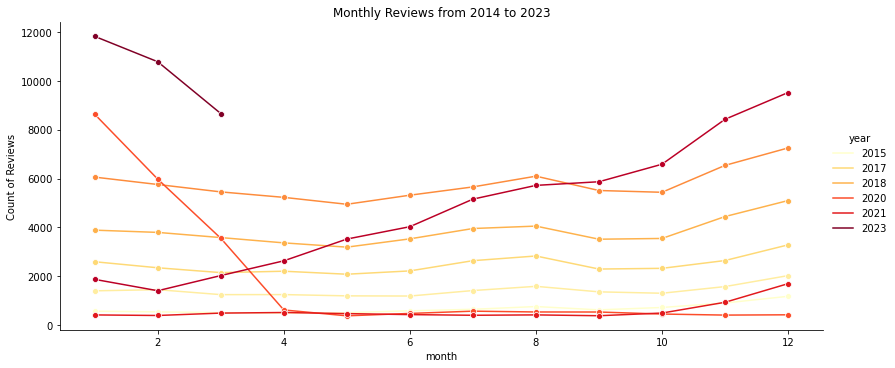

In [48]:
sns.relplot(data=review_count_g,x='month',hue='year',y='comments',marker='o',kind='line',palette="YlOrRd", aspect=14/6)
ax = plt.gca()
ax.set_ylabel("Count of Reviews")
ax.set_title("Monthly Reviews from 2014 to 2023")
plt.show()

### Result Evaluation task №3. 
According to the graph provided, it is evident that there is no discernible seasonal pattern in demand for Airbnb accommodations in Bangkok, owing to the consistently warm climate throughout the year. Instead, only minimal fluctuations can be observed. Moreover, the number of reviews for Airbnb has constantly been increasing yearly, reflecting the service's growth and development. However, in the wake of the Covid-19 pandemic, the review count has experienced a sharp decline due to the cancellation of flights, border closures, and widespread quarantine measures. But after 2022 and 2023, we can see global growth because the quarantined finished.   

In [ ]:
#---------------------------------------------------------------------